## Introduction <a name="in"></a>
<hr>

A crucial step when using machine learning algorithms on real-world datasets is preprocessing. This assignment will give you some practice to build a preliminary supervised machine learning pipeline on a real-world dataset. 

## 1: Introducing and Exploring the dataset <a name="1"></a>
<hr>

In this assignment, you will be working on a sample of [the adult census dataset](https://www.kaggle.com/uciml/adult-census-income#) that we provide as `census.csv`. We have made some modifications to this data so that it's easier to work with. 

This is a classification dataset and the classification task is to predict whether income exceeds 50K per year or not based on the census data. You can find more information on the dataset and features [here](http://archive.ics.uci.edu/ml/datasets/Adult).


*Note that many popular datasets have sex as a feature where the possible values are male and female. This representation reflects how the data were collected and is not meant to imply that, for example, gender is binary.*

In [1]:
import pandas as pd

bank_df = pd.read_csv("BankChurners.csv")
bank_df = bank_df.drop(columns={'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'})

#bank_df['Attrition_Flag'] = bank_df['Attrition_Flag'].apply(lambda x: 1 if x == 'Existing Customer' else 0)
bank_df


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


### 1.1 Data splitting 
rubric={accuracy:2}

<div class="alert alert-info" style="color:black">
    
To avoid violation of the golden rule, the first step before we do anything is splitting the data. 

Split the data into `train_df` (80%) and `test_df` (20%). Keep the target column (`income`) in the splits so that we can use it in EDA. 
Please use `random_state=893`, so that your results are consistent with what we expect.
    
</div>

In [2]:
# Assign the splits to train_df and test_df
from sklearn.model_selection import cross_validate, train_test_split


# Split the dataset into 80% train and 20% test 
train_df, test_df = train_test_split(bank_df, test_size=0.2, random_state=893)

Let's examine our `train_df`,
you can just follow along for the next few cells.

In [3]:
train_df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
4340,718487958,Existing Customer,53,F,2,High School,Married,Less than $40K,Blue,41,...,3,0,2799.0,1303,1496.0,0.763,3971,76,0.551,0.466
7537,713355708,Existing Customer,41,F,3,High School,Married,Unknown,Blue,31,...,6,3,4739.0,1878,2861.0,0.719,5238,84,0.826,0.396
3071,803776533,Existing Customer,46,M,2,Post-Graduate,Single,$60K - $80K,Blue,41,...,3,2,10077.0,0,10077.0,0.639,2118,52,0.576,0.000
7857,788794758,Attrited Customer,46,M,4,Graduate,Single,$40K - $60K,Blue,28,...,2,4,2979.0,0,2979.0,0.644,2061,38,0.462,0.000
1042,778755858,Existing Customer,46,M,3,Graduate,Unknown,$80K - $120K,Blue,27,...,1,3,3665.0,1725,1940.0,0.495,1881,55,0.618,0.471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5153,714407058,Existing Customer,40,M,3,Uneducated,Divorced,$80K - $120K,Blue,29,...,2,1,30997.0,2330,28667.0,0.650,3821,81,0.841,0.075
1444,717769008,Existing Customer,38,M,2,Graduate,Married,$80K - $120K,Blue,36,...,3,4,11444.0,1278,10166.0,1.310,2493,44,0.913,0.112
7086,792345258,Existing Customer,46,F,2,Uneducated,Divorced,Unknown,Blue,40,...,2,3,20080.0,0,20080.0,0.560,4620,70,0.667,0.000
3620,778340733,Existing Customer,44,F,3,College,Married,$40K - $60K,Blue,24,...,1,4,8495.0,1537,6958.0,0.919,1950,31,0.938,0.181


In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8101 entries, 4340 to 1628
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 8101 non-null   int64  
 1   Attrition_Flag            8101 non-null   object 
 2   Customer_Age              8101 non-null   int64  
 3   Gender                    8101 non-null   object 
 4   Dependent_count           8101 non-null   int64  
 5   Education_Level           8101 non-null   object 
 6   Marital_Status            8101 non-null   object 
 7   Income_Category           8101 non-null   object 
 8   Card_Category             8101 non-null   object 
 9   Months_on_book            8101 non-null   int64  
 10  Total_Relationship_Count  8101 non-null   int64  
 11  Months_Inactive_12_mon    8101 non-null   int64  
 12  Contacts_Count_12_mon     8101 non-null   int64  
 13  Credit_Limit              8101 non-null   float64
 14  Total_Revo

It looks like things are in order,
but there is a hidden gotcha with this dataframe.
Let's look at the unique values of each column.

In [5]:
from IPython.display import HTML  # This step is just to avoid the long columns being truncated as "..."

HTML(
    train_df
    .select_dtypes(object)
    .apply(lambda x: sorted(pd.unique(x)))
    .to_frame()
    .to_html()
)

,0
Attrition_Flag,"[Attrited Customer, Existing Customer]"
Gender,"[F, M]"
Education_Level,"[College, Doctorate, Graduate, High School, Post-Graduate, Uneducated, Unknown]"
Marital_Status,"[Divorced, Married, Single, Unknown]"
Income_Category,"[$120K +, $40K - $60K, $60K - $80K, $80K - $120K, Less than $40K, Unknown]"
Card_Category,"[Blue, Gold, Platinum, Silver]"


In [6]:
import numpy as np
# Numerical
train_df.describe(include=[np.number])

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,8.101000e+03,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000
mean,7.390388e+08,46.287002,2.339835,35.908283,3.819899,2.340081,2.461054,8631.511073,1164.757314,7466.753759,0.761662,4420.368967,64.880755,0.709763,0.274365
std,3.692199e+07,8.032094,1.299071,7.975370,1.554612,1.018961,1.099437,9079.865244,818.046309,9074.539666,0.221145,3418.209151,23.523707,0.234651,0.275400
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.129968e+08,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2546.000000,321.000000,1334.000000,0.631000,2170.000000,45.000000,0.581000,0.021000
50%,7.178906e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4559.000000,1277.000000,3475.000000,0.738000,3890.000000,67.000000,0.700000,0.174000
75%,7.730186e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11121.000000,1794.000000,9945.000000,0.861000,4740.000000,81.000000,0.816000,0.500000
max,8.282989e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,138.000000,3.714000,0.999000


In [7]:
# Categorical
train_df.describe(include=[object])

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,8101,8101,8101,8101,8101,8101
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,6797,4289,2524,3766,2849,7542


### Identifying potentially important features


Based on the distribution of targets (attrited and existing customer) showon in the bart charts below, features ***Total_Revolving_Bal, Total_Trans_Amt, Total_Amt_Chng_Q4_Q1, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio*** might be useful to predict. Apart from that, the ***target variable is imbalanced***.


In [8]:
import altair as alt

alt.data_transformers.disable_max_rows()  # Allows us to plot big datasets
alt.Chart(train_df.sort_values('Attrition_Flag')).mark_bar(opacity=0.6).encode(
    alt.X(alt.repeat(), type='quantitative', bin=alt.Bin(maxbins=50)),
    alt.Y('count()', stack=None),
    alt.Color('Attrition_Flag')
).properties(
    height=200
).repeat(
    train_df.select_dtypes('number').columns.to_list(),
    columns=2
)

alt.RepeatChart(...)

In [9]:
alt.Chart(train_df.sort_values('Attrition_Flag')).mark_bar(opacity=0.6).encode(
    alt.X(alt.repeat(), type='nominal'),
    alt.Y('count()', stack=None),
    alt.Color('Attrition_Flag')
).properties(
    height=200
).repeat(
    train_df.select_dtypes('object').columns.to_list(),
    columns=1
)

alt.RepeatChart(...)

In [10]:
X_train = train_df.drop(columns = ['Attrition_Flag'])
y_train = train_df['Attrition_Flag']
X_test = test_df.drop(columns =  ['Attrition_Flag'])
y_test = test_df['Attrition_Flag']

In [11]:
y_train

4340    Existing Customer
7537    Existing Customer
3071    Existing Customer
7857    Attrited Customer
1042    Existing Customer
              ...        
5153    Existing Customer
1444    Existing Customer
7086    Existing Customer
3620    Existing Customer
1628    Attrited Customer
Name: Attrition_Flag, Length: 8101, dtype: object

In [12]:
numeric_features = X_train.select_dtypes('number').columns

categorical_features = X_train.select_dtypes('object').columns

### Build feature pipeline
Let's start making our pipelines. Use `make_pipeline()` or `Pipeline()` to make a pipeline for the numeric features called `numeric_transformer`. 
This pipeline will only have one step, 
the `StandardScaler()`,


Next, make a pipeline for the categorical features called `categorical_transformer`. 
Add a OneHotEncoder as the second step and configure it to ignore unknown values in the test data.


In [13]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [14]:
numeric_transformer = Pipeline(
    steps=[("scaler", StandardScaler())]
)



In [15]:
categorical_transformer = Pipeline(
    steps=[
           ("onehot", OneHotEncoder(sparse_output=False,handle_unknown="ignore"))]
)

### ColumnTransformer


<div class="alert alert-info" style="color:black">

Create a column transformer that applies our numeric pipeline transformations to the numeric feature columns
and our categorical pipeline transformations to the categorical feature columns.
Assign this columns transformer to the variable `preprocessor`.

</div>

In [16]:
preprocessor = ColumnTransformer(
    transformers=[
        ("numeric", numeric_transformer, numeric_features),
        ("categorical", categorical_transformer, categorical_features)
    ],
    remainder='passthrough'
)

In [17]:
# onehot_cols = (
#     preprocessor
#     .named_transformers_["categorical"]
#     .named_steps["onehot"]
#     .get_feature_names_out(categorical_features)
# )
# onehot_cols

In [18]:
#len(onehot_cols)

In [19]:
# columns = numeric_features.tolist() + onehot_cols.tolist()
# len(columns)

## Build and evaluate Model  <a name="4"></a>
To avoid data leak during cross validation, pipeline will be used. Besides, since the target varible is imbalanced data (existing customr 86% and existed customer 14%), the specificity_score will be used to evaluate the model.

### Baseline model - Randomforest Classifier


In [20]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, make_scorer, accuracy_score, precision_score, recall_score, f1_score
from imblearn.metrics import specificity_score
from sklearn.model_selection import cross_validate

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'specificity_score': make_scorer(recall_score,pos_label=0),    #make_scorer(specificity_score),
    'f1': make_scorer(f1_score)
}

In [21]:
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

In [22]:
main_pipe_rf = Pipeline(
    steps=[
        ("columntransformer", preprocessor), # <-- this is the ColumnTransformer we just created
        ("rf", random_forest)])
main_pipe_rf

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy',..._Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')),
                                                 ('categorical',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['Gender', 'Education_Level', 'Marital_Status', 'Income_Category',
       'Card_Category'],
      dtype='object'))])),
                ('rf', RandomForestClassifier(random_state=42))])

In [23]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)

In [24]:
scores = cross_validate(main_pipe_rf, X_train, y_train, scoring=scoring, return_train_score=True)
sc = pd.DataFrame(scores)


In [25]:
mean_specificity_score = sc['test_specificity_score'].mean()
mean_specificity_score 

#average specificity_score is 0.787

0.7868140288829943

### XGboost Classifier


In [26]:
main_pipe = Pipeline(
    steps=[
        ("columntransformer", preprocessor), # <-- this is the ColumnTransformer we just created
        ("xgb", xgb.XGBClassifier(importance_type = 'weight'))])
main_pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy',...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type='weight',
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [27]:
scores_xg = cross_validate(main_pipe, X_train, y_train, scoring=scoring, return_train_score=True,cv=5)
sc_xg = pd.DataFrame(scores_xg)
sc_xg

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_specificity_score,train_specificity_score,test_f1,train_f1
0,0.127541,0.007736,0.972239,1.0,0.981685,1.0,0.985294,1.0,0.904215,1.0,0.983486,1.0
1,0.105996,0.006645,0.967284,1.0,0.974582,1.0,0.986765,1.0,0.865385,1.0,0.980636,1.0
2,0.101167,0.007539,0.974074,1.0,0.981712,1.0,0.987491,1.0,0.904215,1.0,0.984593,1.0
3,0.104308,0.006865,0.969753,1.0,0.979502,1.0,0.984547,1.0,0.892720,1.0,0.982018,1.0
4,0.100695,0.007301,0.975309,1.0,0.979636,1.0,0.991170,1.0,0.892720,1.0,0.985369,1.0


In [28]:
sc_xg['test_specificity_score'].mean()
#average specificity_score is 0.0.892

0.8918508694370765

In [29]:
main_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy',...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type='weight',
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [30]:
y_test = le.fit_transform(y_test)

In [31]:
specificity_score(main_pipe.predict(X_test),y_test)

0.9375

In [32]:
# Get the column names of the transformed data
column_names_transformed = main_pipe.named_steps['columntransformer'].get_feature_names_out()


In [33]:
# Access the XGBoost model within the pipeline
xgb_model = main_pipe.named_steps['xgb']

# Get feature importances from the XGBoost model
feature_importances = xgb_model.feature_importances_
feature_importances

array([0.07128392, 0.06075334, 0.01377076, 0.03969218, 0.04050223,
       0.0218712 , 0.02713649, 0.04495747, 0.05467801, 0.03402187,
       0.1162414 , 0.18793033, 0.09234508, 0.08586472, 0.02956663,
       0.0109356 , 0.        , 0.00121507, 0.00040502, 0.00567031,
       0.00445525, 0.00202511, 0.00324018, 0.00324018, 0.00081004,
       0.01539085, 0.01053058, 0.00445525, 0.00324018, 0.00283516,
       0.00445525, 0.00162009, 0.00324018, 0.        , 0.00121507,
       0.        , 0.        , 0.00040502], dtype=float32)

In [34]:
# Create a DataFrame to display feature names and their importance scores
importance_df = pd.DataFrame({'Feature': column_names_transformed, 'Importance': feature_importances})

# Sort the features by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)
importance_df

,Feature,Importance
11,numeric__Total_Trans_Amt,0.187930
10,numeric__Total_Amt_Chng_Q4_Q1,0.116241
12,numeric__Total_Trans_Ct,0.092345
13,numeric__Total_Ct_Chng_Q4_Q1,0.085865
0,numeric__CLIENTNUM,0.071284
1,numeric__Customer_Age,0.060753
8,numeric__Total_Revolving_Bal,0.054678
7,numeric__Credit_Limit,0.044957
4,numeric__Total_Relationship_Count,0.040502
3,numeric__Months_on_book,0.039692


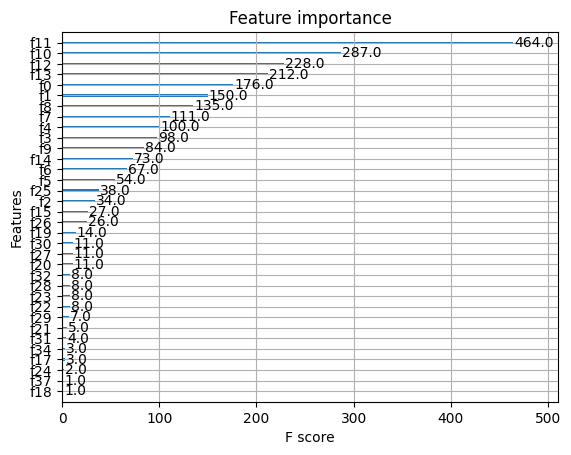

In [35]:
from matplotlib import pyplot
from xgboost import plot_importance
plot_importance(xgb_model)
pyplot.show()

### 3.3 Hyperparameter tuning/optimization

rubric={accuracy:3}

<div class="alert alert-info" style="color:black">

Now that we have our pipelines and a model, let's tune the hyperparameters `gamma` and `C`.
For this tuning,
construct a grid where each hyperparameter can take the values `0.1, 1, 10, 100`
and randomly search for the best combination.

To save some running time on your laptops,
use 3-fold crossvalidation to evaluate each result
and only search for 7 iterations,
and set `n_jobs=-1`.
Return the train and testing score,
set `random_state=289`,
and optionally `verbose=2` if you want to see information as the search is occurring.
Don't forget to fit the best model from the `RandomizedSearchCV` object
on all the training data as the final step.

*This search is quite demanding computationally so be prepared for this to take 2 or 3 minutes and your fan may start to run!*
    
</div>

In [36]:
from sklearn.model_selection import  GridSearchCV


param_grid = {
    'xgb__learning_rate': [ 0.01,0.1, 0.2, 0.3],
    'xgb__max_depth': [3, 4, 5],
    'xgb__min_child_weight': [1, 2, 3],
    'xgb__colsample_bytree': [ 0.9, 1.0],
    'xgb__gamma': [0, 0.1, 0.2],
    'xgb__lambda': [0, 1, 2,3,4],
    'xgb__alpha': [0, 0.1, 0.5,1,2,3,4]

}

f1 = make_scorer(f1_score)
specificity_score = make_scorer(recall_score,pos_label=0)
grid_search = GridSearchCV(main_pipe, param_grid, scoring = f1, return_train_score=True, n_jobs=-1, cv=5)
grid_search.fit(X_train, y_train);

### 3.4 Choosing your hyperparameters
rubric={accuracy:2, reasoning:1}

<div class="alert alert-info" style="color:black">

We are displaying the results from the random hyperparameter search
as a dataframe below.
Looking at this table,
which values for `gamma` and `C` would you choose for your final model and why? 
You can answer this by either manually by using the table
or by accessing the corresponding attributes from the random search object.

</div>

In [37]:
#pd.set_option('display.max_columns', None)
cv_result = pd.DataFrame(grid_search.cv_results_).sort_values(by='mean_test_score', ascending=False)
cv_result

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_xgb__alpha,param_xgb__colsample_bytree,param_xgb__gamma,param_xgb__lambda,param_xgb__learning_rate,param_xgb__max_depth,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
1108,0.137299,0.013693,0.008559,0.002652,0.1,0.9,0,0,0.3,3,...,0.984532,0.001859,1,0.995590,0.995222,0.995959,0.996145,0.996050,0.995793,0.000342
1287,0.146917,0.017802,0.008896,0.003113,0.1,0.9,0.1,0,0.3,3,...,0.984165,0.001326,2,0.995406,0.995313,0.995318,0.996694,0.995775,0.995701,0.000524
1458,0.149238,0.023126,0.008827,0.002403,0.1,0.9,0.2,0,0.2,3,...,0.984046,0.002638,3,0.992478,0.993022,0.992754,0.992756,0.992565,0.992715,0.000188
570,0.140120,0.007804,0.007130,0.002668,0,1.0,0,0,0.3,4,...,0.984035,0.001535,4,1.000000,0.999632,0.999540,0.999908,0.999908,0.999798,0.000178
4023,0.145569,0.015299,0.013084,0.004001,1,1.0,0.1,1,0.3,3,...,0.983964,0.002127,5,0.993845,0.993202,0.995041,0.995135,0.993758,0.994196,0.000762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1225,0.148051,0.012917,0.007655,0.001487,0.1,0.9,0,4,0.01,3,...,0.943410,0.003151,7555,0.944178,0.941013,0.943985,0.945283,0.944202,0.943732,0.001434
1405,0.145763,0.009533,0.008717,0.002278,0.1,0.9,0.1,4,0.01,3,...,0.943410,0.003151,7555,0.944178,0.941013,0.943985,0.945283,0.944202,0.943732,0.001434
3746,0.142970,0.017918,0.010498,0.005470,1,0.9,0.2,4,0.01,3,...,0.943355,0.003636,7558,0.944106,0.942395,0.944159,0.945036,0.944038,0.943947,0.000857
3386,0.156008,0.031985,0.014349,0.008079,1,0.9,0,4,0.01,3,...,0.943355,0.003636,7558,0.944106,0.942395,0.944159,0.945036,0.944038,0.943947,0.000857


In [38]:
grid_search.best_params_

{'xgb__alpha': 0.1,
 'xgb__colsample_bytree': 0.9,
 'xgb__gamma': 0,
 'xgb__lambda': 0,
 'xgb__learning_rate': 0.3,
 'xgb__max_depth': 3,
 'xgb__min_child_weight': 2}

YOUR ANSWER HERE

The best parameter is (gamma = 0.1, c = 0.1)

# 4. Evaluating on the test set <a name="5"></a>
<hr>

Now that we have a best-performing model, it's time to assess our model on the test set. 

### 4.1 Scoring your final model
rubric={accuracy:2}

<div class="alert alert-info" style="color:black">

What is the training and test score of the best scoring model? 
Score the model in two separate cells so that both the training and test scores are displayed.
    
    
</div>

In [39]:
grid_search.score(X_train, y_train)

0.9950775108368232

In [40]:
grid_search.score(X_test, y_test)

0.9827837758972863

### 4.2 Assessing your model
rubric={reasoning:2}

<div class="alert alert-info" style="color:black">

Compare your final model accuracy with your baseline model from question 3.1,
do you consider that our model is performing better than the baseline to such as extent that you would prefer it on deployment data?

Briefly describe one aspect of our model development in this notebook that either supports your confidence in the model we have,
or one possible improvement to what we did here that you think could have increased our model score.
    
</div>

YOUR ANSWER HERE

The test accuracy score has improved from 48% to 82%, so I think the model is performing better than the baseline model. The improvement is mainly attributed to data preprocessing (filling missing values, standardization, and one-hot encoding) and hyperparameter tuning.

### Submission to Canvas

**PLEASE READ: When you are ready to submit your assignment do the following:**

- Read through your solutions
- **Restart your kernel and clear output and rerun your cells from top to bottom** 
- Makes sure that none of your code is broken 
- Convert your notebook to .html format by going to File -> Export Notebook As... -> Export Notebook to HTML
- Upload your `.ipynb` file and the `.html` file to Canvas under Assignment1. 
- **DO NOT** upload any `.csv` files. 

### Congratulations on finishing Assignment 2! Now you are ready to build a simple ML pipeline on real-world datasets!